# Face Generation. Variational Autoencoder

## Loading the Images

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os, glob
from tqdm import tqdm

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, Conv2DTranspose, BatchNormalization, Flatten, Dropout
from tensorflow.keras.layers import Rescaling, Reshape, Lambda, LeakyReLU, ReLU
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K

In [2]:
FOLDER = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba'
INPUT_SHAPE = (128,128,3)
BATCH_SIZE = 64

In [3]:
data = tf.data.Dataset.list_files(FOLDER + '*/*')

In [4]:
def preprocess_image(filename):
    
    image = tf.io.read_file(filename)
    image = tf.io.decode_jpeg(image)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [INPUT_SHAPE[0], INPUT_SHAPE[1]])

    return image

In [5]:
data = data.map(preprocess_image)
print(len(data))

202599


In [6]:
data = data.batch(BATCH_SIZE).shuffle(BATCH_SIZE * 5)
data

<_ShuffleDataset element_spec=TensorSpec(shape=(None, 128, 128, None), dtype=tf.float32, name=None)>

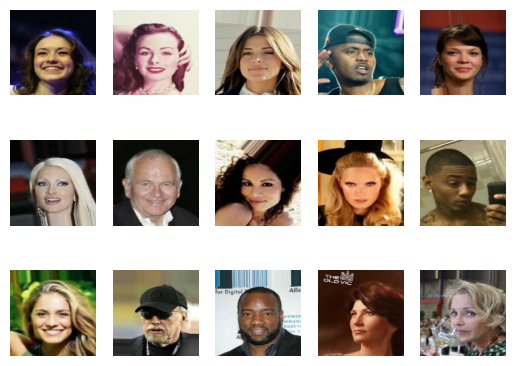

In [7]:
for batch in data.take(1):
    for i in range(15):
        plt.subplot(3, 5, i+1)
        plt.imshow(batch[i])
        plt.axis('off')    
    plt.show()

## Encoder and Decoder

In [8]:
@tf.keras.utils.register_keras_serializable(package="package", name="sampling")
def sampling(args):
    mean, log_var = args
    epsilon = K.random_normal(shape=K.shape(mean), mean=0, stddev=1)
    return mean + K.exp(log_var * 0.5) * epsilon

In [9]:
def set_encoder_decoder(input_shape, 
                        latent_dim = 225, 
                        is_leakyrelu = True, 
                        is_batchnorm = True, 
                        is_dropout = True,
                        lrelu_slope = 0.3):
    #ENCODER
    encoder_input = Input(input_shape, name='encoder_input')
    x = encoder_input

    size = input_shape[0]
    count = 0
    while size != 8:
        x = Conv2D(64, 3, strides=2, padding='same', name=f'encoder_conv_{count}')(x)
        if is_batchnorm:
            x = BatchNormalization(name=f'encoder_bn_{count}')(x)
        if is_leakyrelu:
            x = LeakyReLU(lrelu_slope, name=f'encoder_LReLU_{count}')(x)
        else:
            x = ReLU(name=f'encoder_ReLU_{count}')(x)
        if is_dropout:
            x = Dropout(0.3, name=f'encoder_dropout_{count}')(x)
        count += 1
        size = int(size / 2)

    x = Flatten(name=f'encoder_flatten')(x)
    
    mean = Dense(latent_dim, name='mean')(x)
    log_var = Dense(latent_dim, name='log_var')(x)
    z = Lambda(sampling, name='encoder_output')([mean, log_var])

    encoder = Model(encoder_input, [mean, log_var, z], name='encoder')
    
    #DECODER
    decoder_input = Input((latent_dim,), name='decoder_input')
    x= Dense(size * size * 64, name='decoder_hidden')(decoder_input)
    x = Reshape((size, size, 64))(x)

    count = 0
    while size != input_shape[0]:
        x = Conv2DTranspose(64, 3, strides=2, padding='same', name=f'decoder_convTrans_{count}')(x)
        if is_batchnorm:
            x = BatchNormalization(name=f'decoder_bn_{count}')(x)
        if is_leakyrelu:
            x = LeakyReLU(lrelu_slope, name=f'decoder_LReLU_{count}')(x)
        else:
            x = ReLU(name=f'decoder_ReLU_{count}')(x)
        if is_dropout:
            x = Dropout(0.3, name=f'decoder_dropout_{count}')(x)
        count += 1
        size *= 2

    x = Conv2DTranspose(64, 3, padding='same', name=f'decoder_convTrans_{count}')(x)
    decoder_output = Conv2DTranspose(3, 3, activation='sigmoid', padding = 'same', name='decoder_output')(x)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    
    mean,log_var,z = encoder(encoder.inputs)
    rec = decoder(z)
    
    return encoder, decoder

## VAE

### Callbacks

In [10]:
class MyCallback(tf.keras.callbacks.Callback):
    def __init__(self, period, folder, train):
        super(MyCallback, self).__init__()
        self.folder = folder
        self.period = period
        self.train = train

    def on_epoch_begin(self, epoch, logs=None):
        self.epoch = epoch
        
    def on_train_batch_end(self, batch, logs=None):
        if batch % self.period == 0:
            z = K.random_normal((6, self.model.latent_dim))
            generated = self.model.decoder.predict(z, verbose=0)
            train_rec = self.model.predict(self.train)
            
            fig = plt.figure(constrained_layout=True, figsize=(10,4))
            fig.suptitle(f'Results of Epoch - {self.epoch}, Step - {batch}')
            subfigs = fig.subfigures(nrows=2, ncols=1)
            for subfig, title, sample in zip(subfigs, ['Generated faces', 'Reconstructed train'], [generated, train_rec]):
                subfig.suptitle(title)
                axs = subfig.subplots(1,6)
                for i, ax in enumerate(axs.flatten()):
                    ax.imshow(sample[i])
                    ax.axis('off')
            plt.savefig(f'{self.folder}' + f'{self.epoch}_{batch}')
            plt.show()  

In [11]:
x = list(data.take(1))[0][:6]
x.shape

TensorShape([6, 128, 128, 3])

In [12]:
os.mkdir('/kaggle/working/train_celeba')

### Vae Class

In [27]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder):
        super(VAE, self).__init__()

        self.encoder_input = encoder.inputs
        self.encoder = encoder
        self.decoder = decoder
        self.latent_dim = self.encoder.output[0].shape[1]

    def call(self, inputs):
        mean, log_var, z = self.encoder(inputs)
        reconstruction = self.decoder(z)
        return mean, log_var, reconstruction

    def compile(self, optimizer, loss_factor):
        self.optimizer = optimizer
        self.loss_factor = loss_factor
        
    def predict(self, x):
        mean, log_var, z = self.encoder.predict(x, verbose=0)
        return self.decoder.predict(z, verbose=0)                
        
    def fit(self, x, epochs, init_epoch=1, callbacks=[]): 
        def reconstruction_loss(batch, reconstructed):
            rec_loss = tf.reduce_mean(tf.square(batch - reconstructed))
            return rec_loss
        def KL_div(mean, log_var):
            kl_loss =  -0.5 * tf.reduce_mean(1 + log_var - tf.square(mean) - tf.exp(log_var))
            return kl_loss
        def compute_loss(self, batch):
            mean, log_var, reconstructed = self(batch)
            rec_loss = reconstruction_loss(batch, reconstructed)
            kl_loss = KL_div(mean, log_var)
            loss = self.loss_factor * rec_loss + kl_loss
            return loss, rec_loss, kl_loss
            
        callback_list = tf.keras.callbacks.CallbackList(
            callbacks, model=self)
        hist = {'VAE_loss': [], 'rec_loss': [], 'KL_loss': []}
        logs = {}

        callback_list.on_train_begin(logs=logs)
        for epoch in range(init_epoch , epochs+1):
            callback_list.on_epoch_begin(epoch, logs=logs)
            
            progress_bar = tqdm(enumerate(x), total=len(x))
            for step, training_batch in progress_bar:
                with tf.GradientTape() as tape:
                    loss, rec_loss, kl_loss = compute_loss(self, training_batch)\
                    
                hist['VAE_loss'].append(loss.numpy())
                hist['rec_loss'].append(rec_loss.numpy())
                hist['KL_loss'].append(kl_loss.numpy())
                logs['VAE_loss'] = loss.numpy()
                logs['rec_loss'] = rec_loss.numpy()
                logs['KL_loss'] = kl_loss.numpy()

                gradients = tape.gradient(loss, self.trainable_variables)
                self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
                progress_bar.set_description(
                    'Epoch: {} - Loss: {:.3f} - rec_loss: {:.5f} - KL_loss: {:.3f}'\
                    .format(epoch, loss.numpy(), rec_loss.numpy(), kl_loss.numpy()))

                
                
                callback_list.on_train_batch_end(step, logs=logs)
            callback_list.on_epoch_end(epoch, logs=logs)                    

        return hist

## Hyperparameter analysis

In [16]:
params = {'loss_factor': [16, 64, 256, 1024, 4096]}
results = {}
for loss_factor in params['loss_factor']:
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0015)
    encoder, decoder = set_encoder_decoder(INPUT_SHAPE)
    model = VAE(encoder, decoder)
    model.compile(optimizer, loss_factor)
    hist = model.fit(data, 1)
    results[f'loss_factor={loss_factor}'] = hist

Epoch: 1 - Loss: 0.459 - rec_loss: 0.02081 - KL_loss: 0.126: 100%|██████████| 3166/3166 [14:47<00:00,  3.57it/s]
Epoch: 1 - Loss: 1.158 - rec_loss: 0.01269 - KL_loss: 0.346: 100%|██████████| 3166/3166 [14:15<00:00,  3.70it/s]
Epoch: 1 - Loss: 3.049 - rec_loss: 0.00853 - KL_loss: 0.866: 100%|██████████| 3166/3166 [14:12<00:00,  3.71it/s]
Epoch: 1 - Loss: 7.946 - rec_loss: 0.00596 - KL_loss: 1.843: 100%|██████████| 3166/3166 [14:10<00:00,  3.72it/s] 
Epoch: 1 - Loss: 25.357 - rec_loss: 0.00555 - KL_loss: 2.640: 100%|██████████| 3166/3166 [14:13<00:00,  3.71it/s]


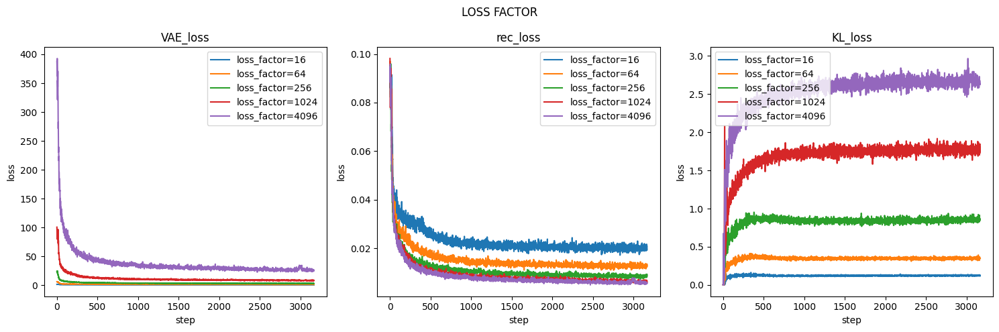

In [17]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs = axs.flatten()
for key in list(results.keys()):
    for i, loss in enumerate(['VAE_loss', 'rec_loss', 'KL_loss']):
        axs[i].plot(results[key][loss], label = key)
        axs[i].set(title = loss, xlabel = 'step', ylabel = 'loss')
        axs[i].legend()
plt.suptitle('LOSS FACTOR')
plt.tight_layout()
plt.savefig('/kaggle/working/loss_factor.jpg')
plt.show()

In [18]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0015)
model = VAE(*set_encoder_decoder(INPUT_SHAPE))
model.compile(loss_factor = 128, optimizer = optimizer)
hist = model.fit(data, 1)

Epoch: 1 - Loss: 1.889 - rec_loss: 0.01054 - KL_loss: 0.539: 100%|██████████| 3166/3166 [14:07<00:00,  3.73it/s]


In [19]:
results2 = {}
for name in ['is_leakyrelu', 'is_batchnorm', 'is_dropout']:
    results2[name+'=True'] = hist

In [20]:
params = {'latent_dim': [64, 144, 256, 529, 1024],
          'is_leakyrelu': [False],
          'is_batchnorm': [False],
          'is_dropout': [False]}
for key, values in params.items():
    for val in values:
        optimizer = tf.keras.optimizers.Adam(learning_rate=0.0015)
        model = VAE(
            *set_encoder_decoder(input_shape = INPUT_SHAPE, **{key: val})
        )
        model.compile(loss_factor = 128, optimizer = optimizer)
        hist = model.fit(data, 1)
        results2[f'{key}={val}'] = hist

Epoch: 1 - Loss: 2.766 - rec_loss: 0.01528 - KL_loss: 0.810: 100%|██████████| 3166/3166 [14:07<00:00,  3.74it/s]
Epoch: 1 - Loss: 2.277 - rec_loss: 0.01253 - KL_loss: 0.673: 100%|██████████| 3166/3166 [14:06<00:00,  3.74it/s]
Epoch: 1 - Loss: 1.747 - rec_loss: 0.00948 - KL_loss: 0.534: 100%|██████████| 3166/3166 [14:07<00:00,  3.74it/s]
Epoch: 1 - Loss: 1.552 - rec_loss: 0.00884 - KL_loss: 0.421: 100%|██████████| 3166/3166 [14:07<00:00,  3.74it/s]
Epoch: 1 - Loss: 1.238 - rec_loss: 0.00705 - KL_loss: 0.335: 100%|██████████| 3166/3166 [14:04<00:00,  3.75it/s]
Epoch: 1 - Loss: 1.918 - rec_loss: 0.01093 - KL_loss: 0.519: 100%|██████████| 3166/3166 [14:11<00:00,  3.72it/s]
Epoch: 1 - Loss: 1.984 - rec_loss: 0.01083 - KL_loss: 0.598: 100%|██████████| 3166/3166 [09:39<00:00,  5.46it/s]
Epoch: 1 - Loss: 1.830 - rec_loss: 0.01006 - KL_loss: 0.542: 100%|██████████| 3166/3166 [14:05<00:00,  3.74it/s]


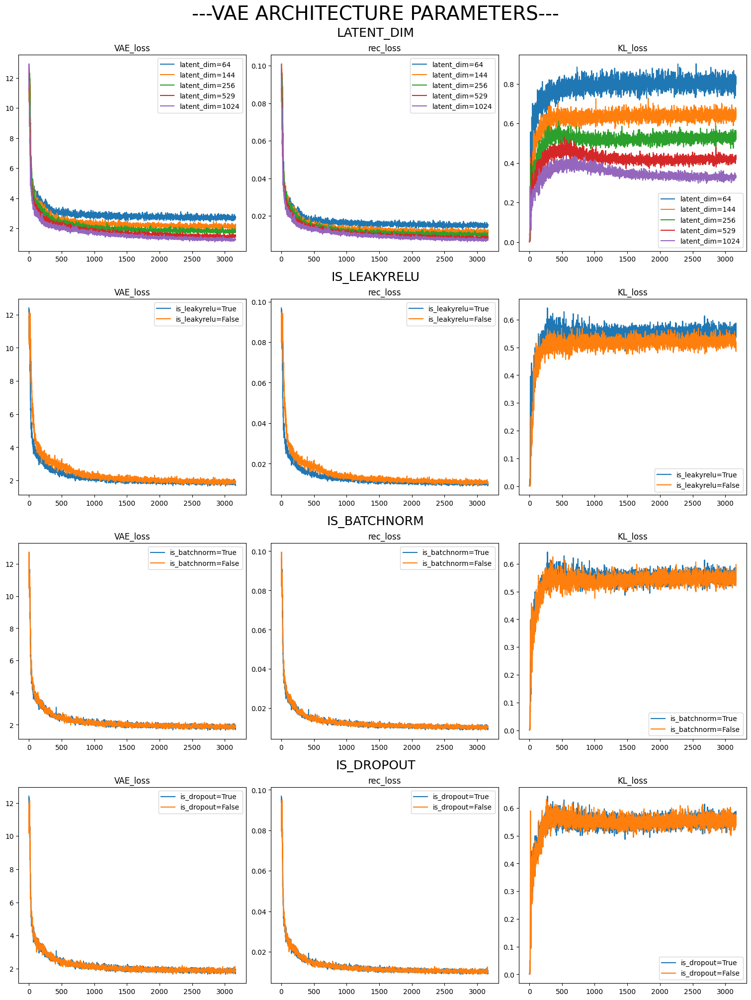

In [29]:
fig = plt.figure(constrained_layout=True, figsize=(15, 20))
fig.suptitle("---VAE ARCHITECTURE PARAMETERS---",fontsize=28)
subfigs = fig.subfigures(nrows=4, ncols=1)
subfigs = subfigs.flatten()
for i, param in enumerate(list(params.keys())):
    keys = [key for key in list(results2.keys()) if param in key]
    subfigs[i].suptitle(param.upper(), fontsize=18)
    axs = subfigs[i].subplots(1, 3)
    axs = axs.flatten()
    for key in keys:
        for j, loss in enumerate(['VAE_loss', 'rec_loss', 'KL_loss']):
            axs[j].plot(results2[key][loss], label = key)
            axs[j].set(title = loss)
            axs[j].legend()
plt.savefig('/kaggle/working/parameters.jpg')
plt.show()

## Training the Network

In [47]:
mycallback = MyCallback(
    period = 1600, 
    folder = '/kaggle/working/train_celeba/',
    train = x
)
lrsheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor = 'VAE_loss',
    factor = 0.2,
    patience = 1,
    verbose = 1,
    min_delta = 0.1,
)

In [42]:
encoder, decoder = set_encoder_decoder(
    INPUT_SHAPE, 
    latent_dim = 1024,
    is_leakyrelu = True,
    lrelu_slope = 0.1,
    is_batchnorm = False,
    is_dropout = False
)

In [43]:
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ encoder_input       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_conv_0      │ (None, 64, 64,    │      1,792 │ encoder_input[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_LReLU_0     │ (None, 64, 64,    │          0 │ encoder_conv_0[0… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_conv_1      │ (None, 32, 32,    │     36,928 │ encoder_LReLU_0[… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_LReLU_1     │ (None, 32, 32,    │          0 │ encoder_conv_1[0… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_conv_2      │ (None, 16, 16,    │     36,928 │ encoder_LReLU_1[… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_LReLU_2     │ (None, 16, 16,    │          0 │ encoder_conv_2[0… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_conv_3      │ (None, 8, 8, 64)  │     36,928 │ encoder_LReLU_2[… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_LReLU_3     │ (None, 8, 8, 64)  │          0 │ encoder_conv_3[0… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_flatten     │ (None, 4096)      │          0 │ encoder_LReLU_3[… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mean (Dense)        │ (None, 1024)      │  4,195,328 │ encoder_flatten[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ log_var (Dense)     │ (None, 1024)      │  4,195,328 │ encoder_flatten[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder_output      │ (None, 1024)      │          0 │ mean[0][0],       │
│ (Lambda)            │                   │            │ log_var[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 8,503,232 (32.44 MB)

 Trainable params: 8,503,232 (32.44 MB)

 Non-trainable params: 0 (0.00 B)

In [44]:
decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)      │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_hidden (Dense)          │ (None, 4096)           │     4,198,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_convTrans_0             │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_LReLU_0 (LeakyReLU)     │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_convTrans_1             │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_LReLU_1 (LeakyReLU)     │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_convTrans_2             │ (None, 64, 64, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_LReLU_2 (LeakyReLU)     │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_convTrans_3             │ (None, 128, 128, 64)   │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_LReLU_3 (LeakyReLU)     │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_convTrans_4             │ (None, 128, 128, 64)   │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_output                  │ (None, 128, 128, 3)    │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,384,771 (16.73 MB)

 Trainable params: 4,384,771 (16.73 MB)

 Non-trainable params: 0 (0.00 B)

In [45]:
vae = VAE(encoder, decoder)
vae.summary()

Model: "vae_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder (Functional)            │ [(None, 1024), (None,  │     8,503,232 │
│                                 │ 1024), (None, 1024)]   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 128, 128, 3)    │     4,384,771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,888,003 (49.16 MB)

 Trainable params: 12,888,003 (49.16 MB)

 Non-trainable params: 0 (0.00 B)

In [46]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0015)
loss_factor = 64
vae.compile(loss_factor = loss_factor, optimizer = optimizer)

Epoch: 1 - Loss: 6.029 - rec_loss: 0.09419 - KL_loss: 0.001:   0%|          | 0/3166 [00:08<?, ?it/s]

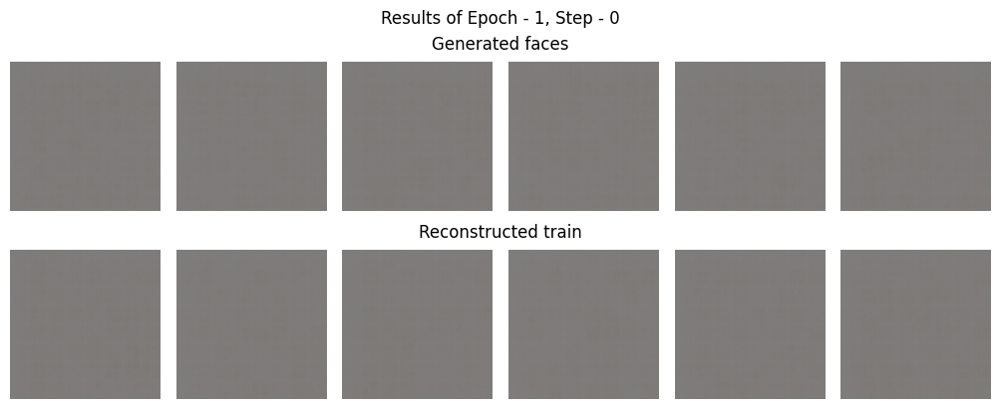

Epoch: 1 - Loss: 0.948 - rec_loss: 0.01137 - KL_loss: 0.220:  51%|█████     | 1600/3166 [05:11<04:50,  5.39it/s]

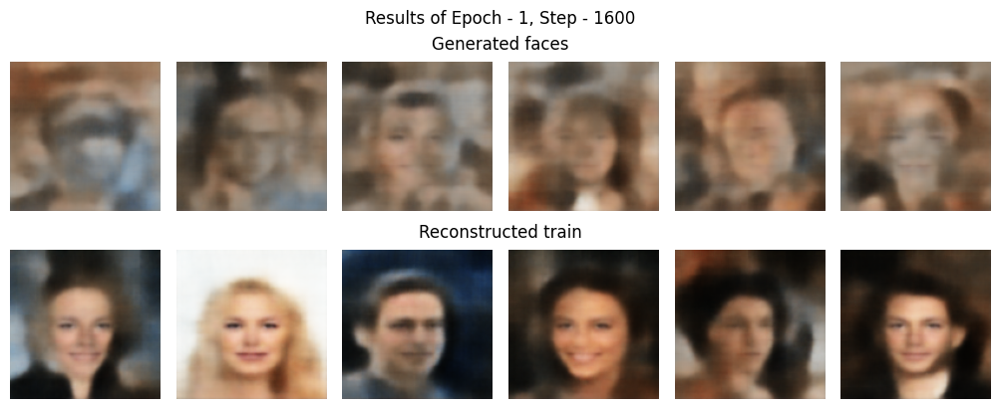

Epoch: 1 - Loss: 0.833 - rec_loss: 0.00977 - KL_loss: 0.208: 100%|██████████| 3166/3166 [10:01<00:00,  5.26it/s]
Epoch: 2 - Loss: 0.776 - rec_loss: 0.00911 - KL_loss: 0.193:   0%|          | 0/3166 [00:27<?, ?it/s]

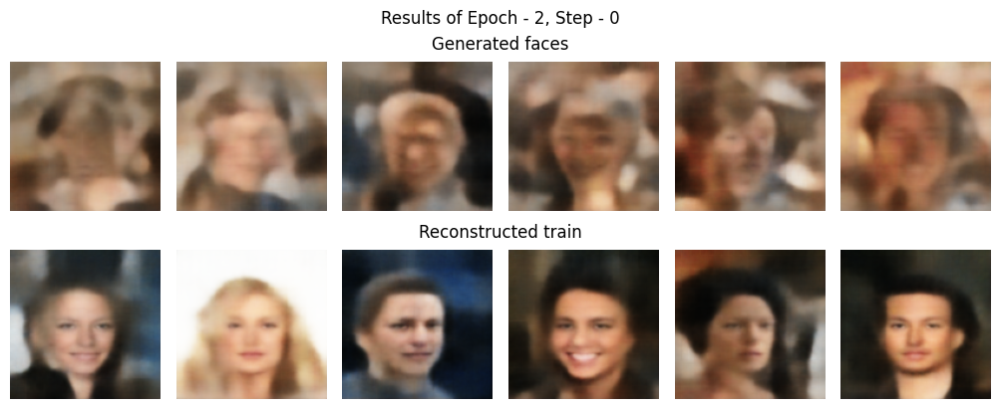

Epoch: 2 - Loss: 0.738 - rec_loss: 0.00817 - KL_loss: 0.215:  51%|█████     | 1600/3166 [05:29<04:43,  5.52it/s]

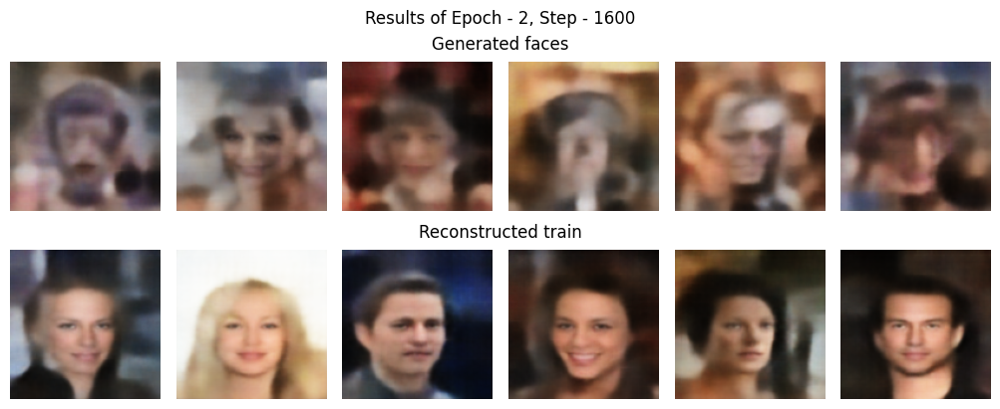

Epoch: 2 - Loss: 0.761 - rec_loss: 0.00853 - KL_loss: 0.215: 100%|██████████| 3166/3166 [10:19<00:00,  5.11it/s]


Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00030000000260770325.



Epoch: 3 - Loss: 0.724 - rec_loss: 0.00802 - KL_loss: 0.210:   0%|          | 0/3166 [00:07<?, ?it/s]

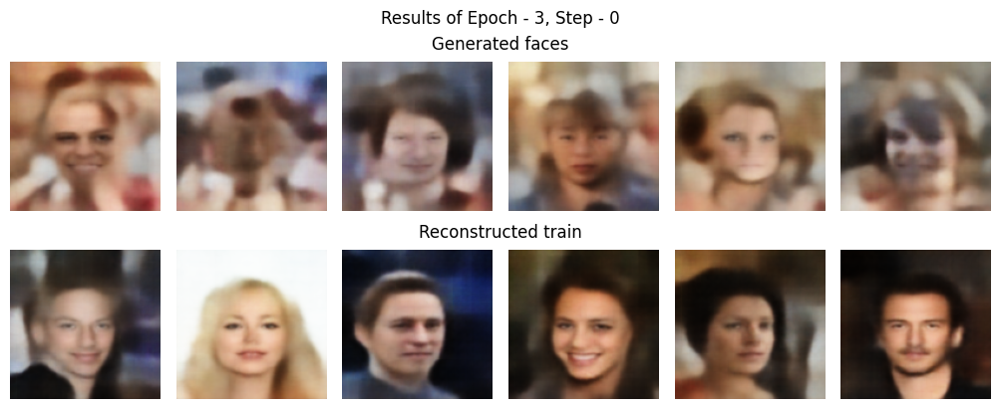

Epoch: 3 - Loss: 0.690 - rec_loss: 0.00749 - KL_loss: 0.211:  51%|█████     | 1600/3166 [05:10<04:52,  5.36it/s]

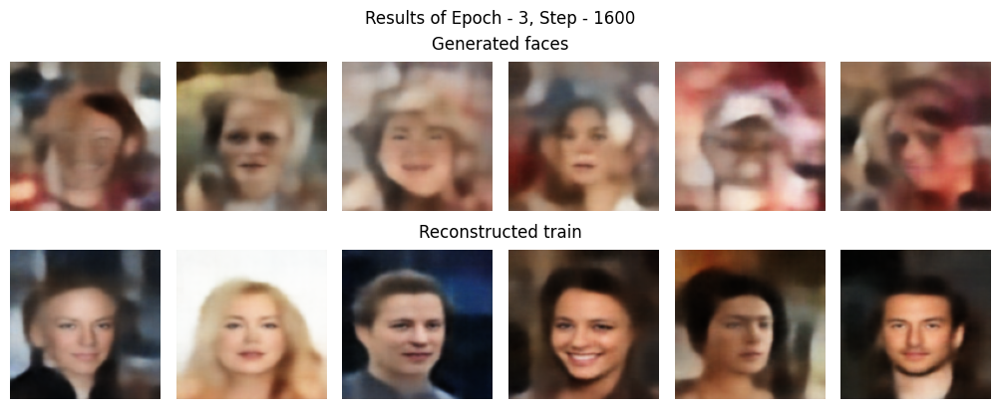

Epoch: 3 - Loss: 0.673 - rec_loss: 0.00719 - KL_loss: 0.213: 100%|██████████| 3166/3166 [10:02<00:00,  5.25it/s]
Epoch: 4 - Loss: 0.691 - rec_loss: 0.00741 - KL_loss: 0.216:   0%|          | 0/3166 [00:06<?, ?it/s]

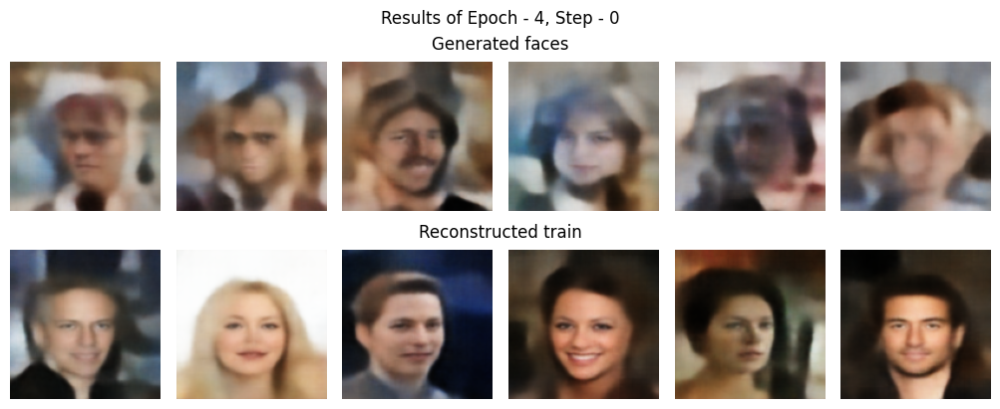

Epoch: 4 - Loss: 0.690 - rec_loss: 0.00754 - KL_loss: 0.208:  51%|█████     | 1600/3166 [05:08<04:54,  5.32it/s]

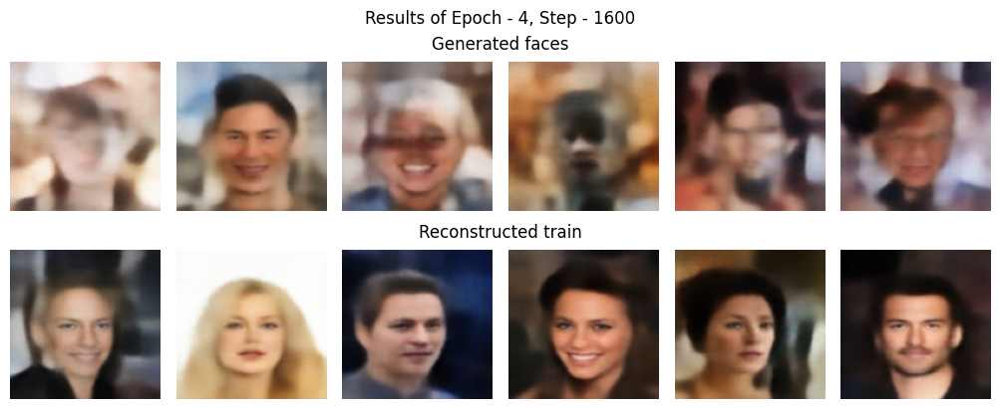

Epoch: 4 - Loss: 0.716 - rec_loss: 0.00785 - KL_loss: 0.214: 100%|██████████| 3166/3166 [09:58<00:00,  5.29it/s]


Epoch 5: ReduceLROnPlateau reducing learning rate to 6.000000284984708e-05.



Epoch: 5 - Loss: 0.635 - rec_loss: 0.00669 - KL_loss: 0.207:   0%|          | 0/3166 [00:06<?, ?it/s]

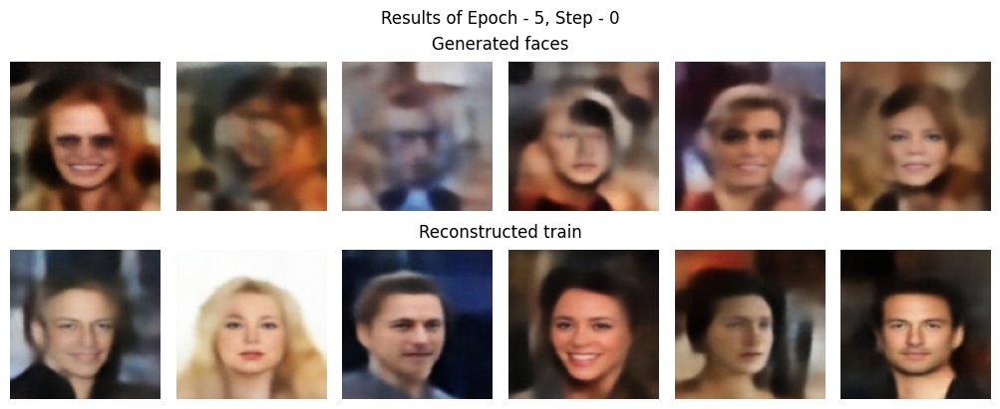

Epoch: 5 - Loss: 0.640 - rec_loss: 0.00670 - KL_loss: 0.212:  51%|█████     | 1600/3166 [04:58<04:44,  5.51it/s]

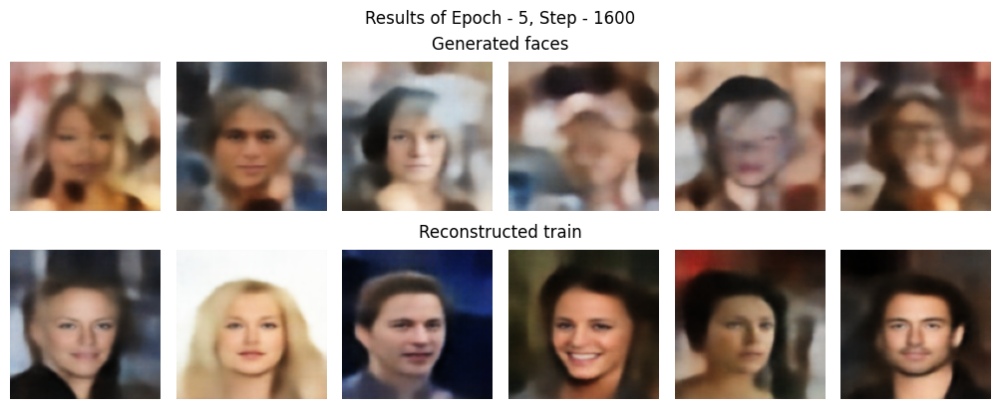

Epoch: 5 - Loss: 0.622 - rec_loss: 0.00655 - KL_loss: 0.203: 100%|██████████| 3166/3166 [09:39<00:00,  5.46it/s]


Epoch 6: ReduceLROnPlateau reducing learning rate to 1.2000000424450263e-05.



Epoch: 6 - Loss: 0.663 - rec_loss: 0.00711 - KL_loss: 0.208:   0%|          | 0/3166 [00:07<?, ?it/s]

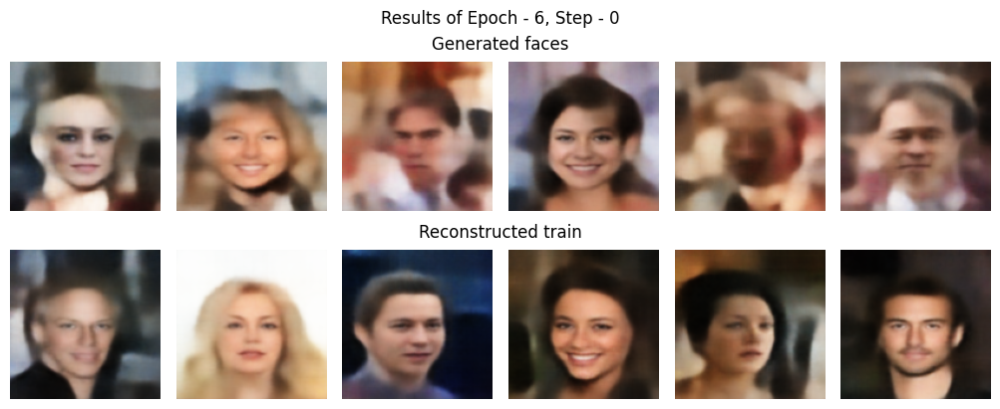

Epoch: 6 - Loss: 0.610 - rec_loss: 0.00636 - KL_loss: 0.203:  51%|█████     | 1600/3166 [04:57<04:45,  5.49it/s]

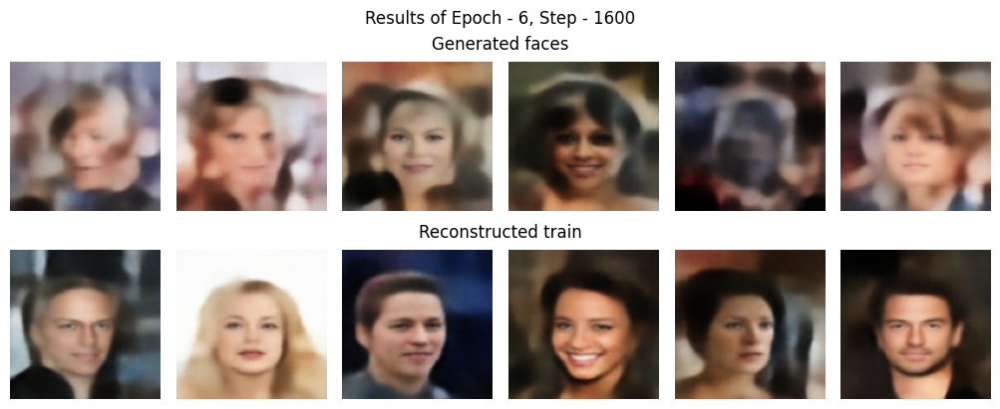

Epoch: 6 - Loss: 0.650 - rec_loss: 0.00693 - KL_loss: 0.206: 100%|██████████| 3166/3166 [09:40<00:00,  5.46it/s]


Epoch 7: ReduceLROnPlateau reducing learning rate to 2.4000000848900527e-06.



Epoch: 7 - Loss: 0.703 - rec_loss: 0.00759 - KL_loss: 0.217:   0%|          | 0/3166 [00:08<?, ?it/s]

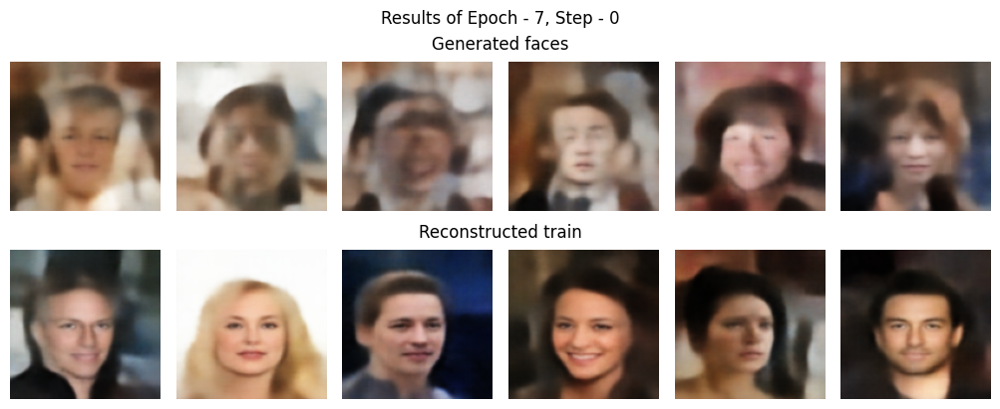

Epoch: 7 - Loss: 0.628 - rec_loss: 0.00662 - KL_loss: 0.205:  51%|█████     | 1600/3166 [04:59<04:38,  5.62it/s]

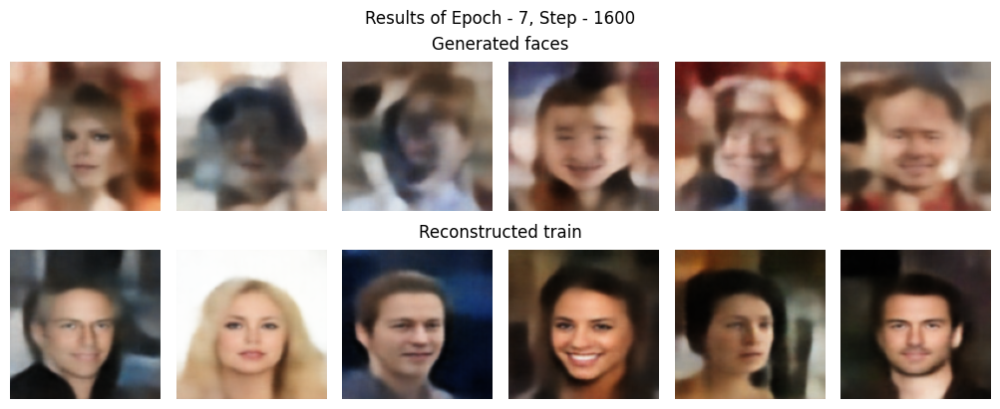

Epoch: 7 - Loss: 0.665 - rec_loss: 0.00705 - KL_loss: 0.213: 100%|██████████| 3166/3166 [09:41<00:00,  5.45it/s]


Epoch 8: ReduceLROnPlateau reducing learning rate to 4.800000169780105e-07.



Epoch: 8 - Loss: 0.674 - rec_loss: 0.00718 - KL_loss: 0.215:   0%|          | 0/3166 [00:07<?, ?it/s]

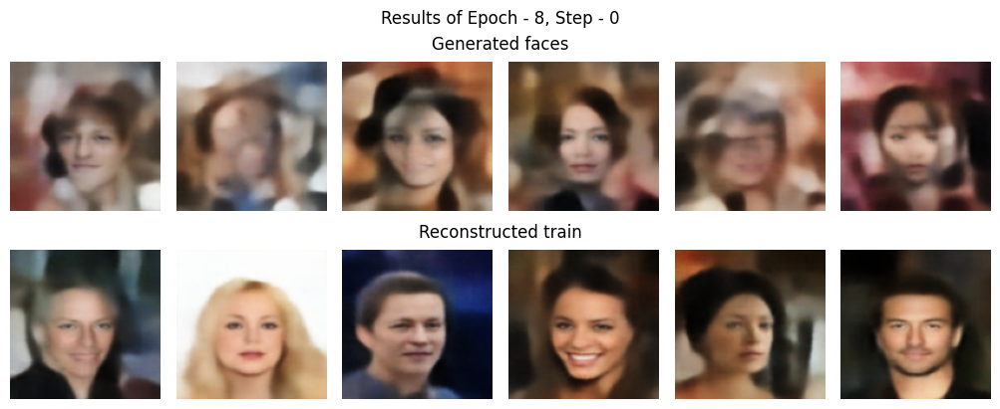

Epoch: 8 - Loss: 0.636 - rec_loss: 0.00670 - KL_loss: 0.208:  51%|█████     | 1600/3166 [04:57<04:38,  5.62it/s]

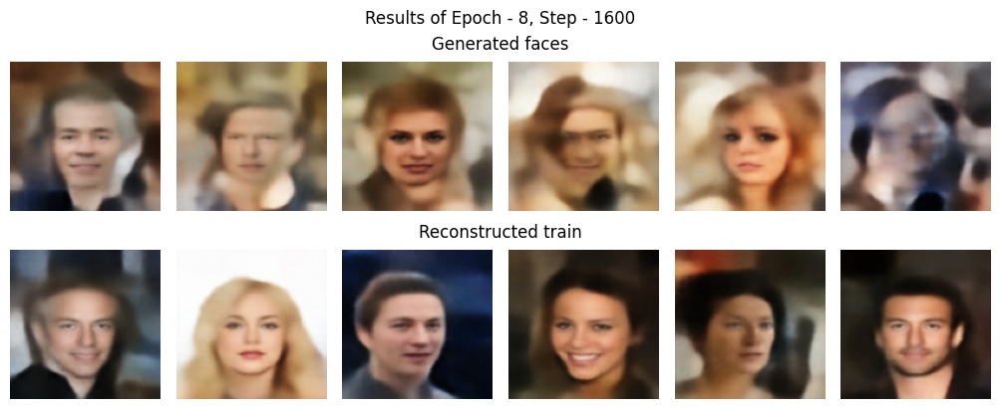

Epoch: 8 - Loss: 0.671 - rec_loss: 0.00714 - KL_loss: 0.214: 100%|██████████| 3166/3166 [09:39<00:00,  5.46it/s]


Epoch 9: ReduceLROnPlateau reducing learning rate to 9.600000794307562e-08.



Epoch: 9 - Loss: 0.620 - rec_loss: 0.00647 - KL_loss: 0.206:   0%|          | 0/3166 [00:07<?, ?it/s]

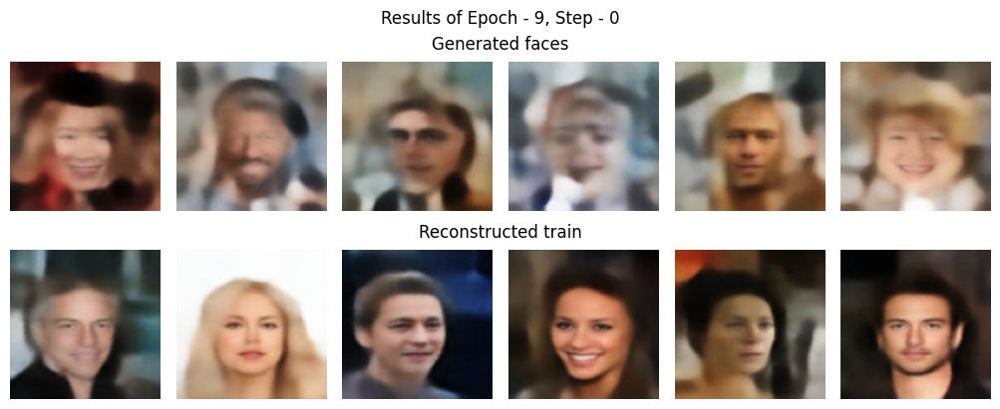

Epoch: 9 - Loss: 0.648 - rec_loss: 0.00684 - KL_loss: 0.210:  51%|█████     | 1600/3166 [04:59<04:43,  5.52it/s]

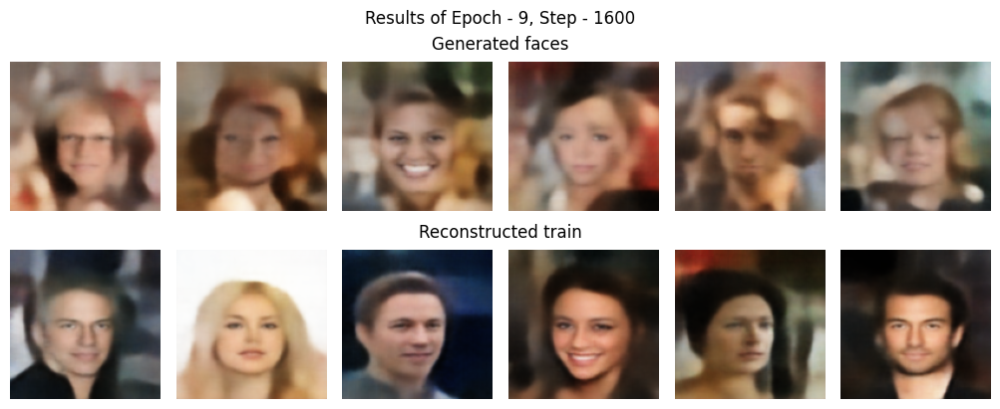

Epoch: 9 - Loss: 0.631 - rec_loss: 0.00662 - KL_loss: 0.208: 100%|██████████| 3166/3166 [09:41<00:00,  5.44it/s]


Epoch 10: ReduceLROnPlateau reducing learning rate to 1.9200001588615123e-08.



Epoch: 10 - Loss: 0.643 - rec_loss: 0.00680 - KL_loss: 0.208:   0%|          | 0/3166 [00:47<?, ?it/s]

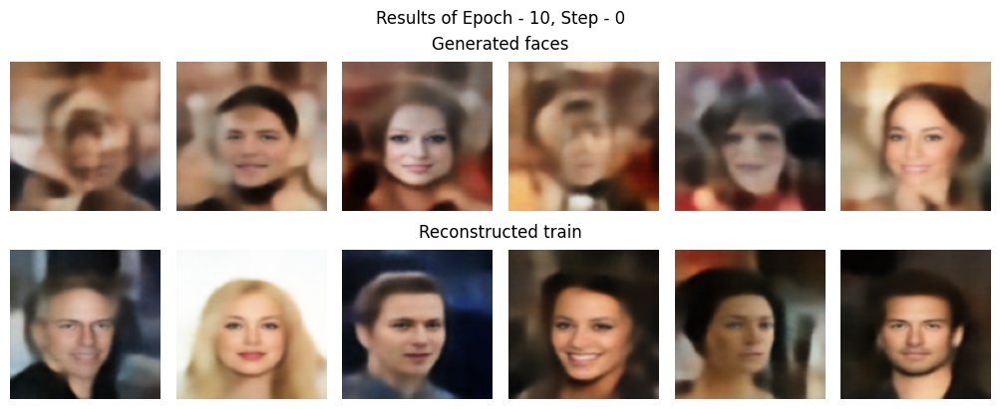

Epoch: 10 - Loss: 0.647 - rec_loss: 0.00686 - KL_loss: 0.208:  51%|█████     | 1600/3166 [05:39<04:38,  5.62it/s]

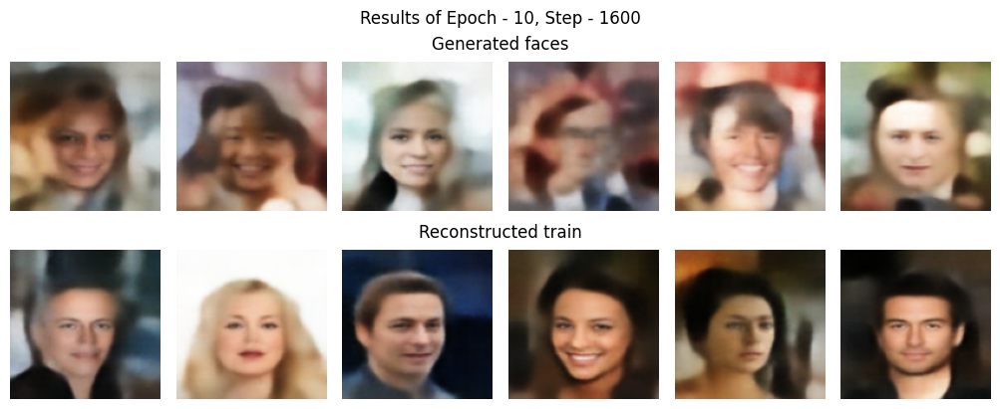

Epoch: 10 - Loss: 0.649 - rec_loss: 0.00675 - KL_loss: 0.217: 100%|██████████| 3166/3166 [10:21<00:00,  5.10it/s]


Epoch 11: ReduceLROnPlateau reducing learning rate to 3.840000317723025e-09.


In [48]:
hist = vae.fit(data, 10, callbacks=[mycallback, lrsheduler])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


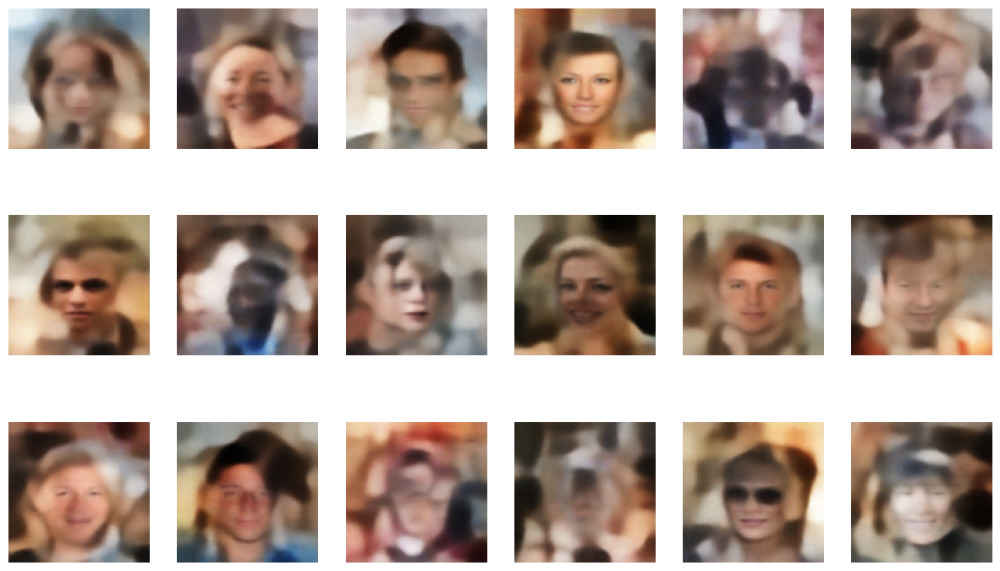

In [57]:
z = K.random_normal(shape=[18, 1024])
z = decoder.predict(z)
plt.figure(figsize=(15,9))
for i in range(18):
    plt.subplot(3,6,i+1)
    plt.imshow(z[i])
    plt.axis('off')

In [53]:
vae.save_weights('/kaggle/working/vae.weights.h5')
vae.encoder.save_weights('/kaggle/working/encoder.weights.h5')
vae.decoder.save_weights('/kaggle/working/decoder.weights.h5')

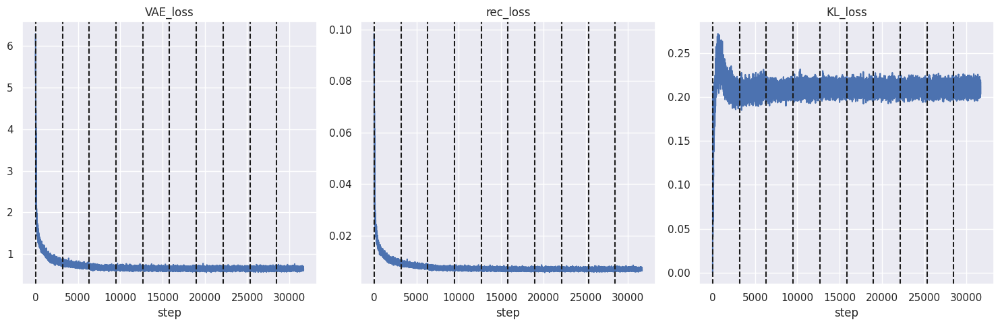

In [55]:
import seaborn as sns
sns.set_theme()

epochs = 10
_, axs = plt.subplots(1, 3, figsize=(15,5))
for i, key in zip(range(3), hist.keys()):
    axs[i].plot(hist[key])
    axs[i].set(title=key, xlabel='step')
    for j in range(epochs):
        axs[i].axvline(len(data)*j, color='k', label='epoch', linestyle='--')
plt.tight_layout()
plt.savefig('/kaggle/working/training.jpg')
plt.show()